# IBM DATA SCIENCE CAPSTONE: JAVE TRUCK PILOT PROJECT


# --------------------------Section 1: Data Acquisiont and Cleaning---------------------------

# Part 1: Import Dependencies
---

In [1]:
#!pip install pandas==1.0.3 #In order to avoid json_normalize error
#!conda install -c conda-forge folium=0.5.0 --yes
#!pip install geocoder
#!pip install folium==0.5.0
#!pip install folium==0.7.0
#!pip install folium --upgrade
import folium
from folium import plugins
from folium.plugins import HeatMap
import geocoder # import geocoder
from geopy.geocoders import Nominatim
import pandas as pd # library for data analsysis
import itertools
import numpy as np
import json
from pandas.io.json import json_normalize
import requests # library to handle requests
from sklearn import preprocessing
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

In [2]:
#!pip list

# Part 2: Read in GeoJson and Clean/Process
---
**Most of the preprocessing of the geospatial data was accomplished externally using the geojson editor at https://digital-geography.com/online-geojson-editor/. Here all cases including the label 'CENTRE' under the 'properties.sector' feature were removed, and only the 'Residential' label was kept for the feature 'properties.class'. This was acomplished externaly so that the geospatial file used would correspond directly with the communities under analysis here, this way an abundance of null values could be avoided in the choropleth maps to follow. The file was then read in, transformed to the dataframe 'CGY_GEO_DF', and the column labels re-titled.**  

In [3]:
filepath = r"C:\Users\ajcla\Documents\Cont Ed 2020\Coursera\IBM Intro to Data Science Specialization\DATA SCIENCE CAPSTONE\Week 4\CAPSTONE\Java Truck\Data\Geospatial\CGY_Boundaries_Mod.geojson"
with open(filepath) as f:
    cgy_geo = json.load(f)

In [4]:
cgy_geo

{'type': 'FeatureCollection',
 'features': [{'type': 'Feature',
   'properties': {'comm_structure': 'BUILDING OUT',
    'name': 'WEST SPRINGS',
    'sector': 'WEST',
    'class_code': 1,
    'srg': 'DEVELOPING',
    'class': 'Residential',
    'comm_code': 'WSP'},
   'geometry': {'type': 'Polygon',
    'coordinates': [[[-114.187805990867, 51.061506344418],
      [-114.187805319369, 51.060938411096],
      [-114.187660747632, 51.06094520128],
      [-114.187657159918, 51.060503064822],
      [-114.187655566678, 51.059784642277],
      [-114.187655370367, 51.05969585023],
      [-114.187803686521, 51.059695612033],
      [-114.188301871831, 51.05969534995],
      [-114.188511078979, 51.059695068486],
      [-114.188818401902, 51.05969465517],
      [-114.189208294417, 51.059694128999],
      [-114.189239810438, 51.059694086971],
      [-114.189240832208, 51.059401636229],
      [-114.189240559048, 51.059243645026],
      [-114.189240340299, 51.05912839536],
      [-114.189240135663, 51.0

In [5]:
CGY_GEO_DF = pd.json_normalize(cgy_geo["features"])
CGY_GEO_DF.head()

,type,properties.comm_structure,properties.name,properties.sector,properties.class_code,properties.srg,properties.class,properties.comm_code,geometry.type,geometry.coordinates
0,Feature,BUILDING OUT,WEST SPRINGS,WEST,1,DEVELOPING,Residential,WSP,Polygon,"[[[-114.187805990867, 51.061506344418], [-114...."
1,Feature,OTHER,UNIVERSITY OF CALGARY,NORTHWEST,1,BUILT-OUT,Residential,UOC,Polygon,"[[[-114.141027621875, 51.074356354528], [-114...."
2,Feature,1950s,OGDEN,SOUTHEAST,1,BUILT-OUT,Residential,OGD,Polygon,"[[[-114.01308159924, 50.999734282292], [-114.0..."
3,Feature,1960s/1970s,QUEENSLAND,SOUTH,1,BUILT-OUT,Residential,QLD,Polygon,"[[[-114.018507740242, 50.943017867576], [-114...."
4,Feature,1950s,WILDWOOD,WEST,1,BUILT-OUT,Residential,WLD,Polygon,"[[[-114.172541631645, 51.069562213362], [-114...."


In [6]:
CGY_GEO_DF.to_csv('CGY Geo Data Raw.csv')

In [7]:
CGY_GEO_DF = CGY_GEO_DF[['properties.name', 'properties.sector', 'properties.class', 'geometry.coordinates']]
CGY_GEO_DF = CGY_GEO_DF.rename(columns = {'properties.name':'Community', 'properties.sector':'Sector', 
                                          'properties.class':'Class', 'geometry.coordinates':'Geometry'})

In [8]:
CGY_GEO_DF.sort_values(by = 'Community', inplace = True)
CGY_GEO_DF.reset_index(drop = True, inplace = True)
CGY_GEO_DF.head()

,Community,Sector,Class,Geometry
0,ABBEYDALE,NORTHEAST,Residential,"[[[-113.935119222348, 51.066971217534], [-113...."
1,ACADIA,SOUTH,Residential,"[[[-114.050011663006, 50.980779027506], [-114...."
2,ALBERT PARK/RADISSON HEIGHTS,EAST,Residential,"[[[-113.981603373819, 51.045152523422], [-113...."
3,APPLEWOOD PARK,EAST,Residential,"[[[-113.92121990751, 51.045202685087], [-113.9..."
4,ARBOUR LAKE,NORTHWEST,Residential,"[[[-114.195874805226, 51.142711804116], [-114...."


# Part 3: Extract/clean/process partial community profile dataframe
---

In [9]:
CGY_COMM = CGY_GEO_DF.drop(['Geometry'], axis = 1).reset_index(drop = True)
CGY_COMM.head()

,Community,Sector,Class
0,ABBEYDALE,NORTHEAST,Residential
1,ACADIA,SOUTH,Residential
2,ALBERT PARK/RADISSON HEIGHTS,EAST,Residential
3,APPLEWOOD PARK,EAST,Residential
4,ARBOUR LAKE,NORTHWEST,Residential


In [10]:
CGY_COMM.sort_values(by = 'Community', inplace = True)
CGY_COMM.reset_index(drop = True, inplace = True)
CGY_COMM.head()

,Community,Sector,Class
0,ABBEYDALE,NORTHEAST,Residential
1,ACADIA,SOUTH,Residential
2,ALBERT PARK/RADISSON HEIGHTS,EAST,Residential
3,APPLEWOOD PARK,EAST,Residential
4,ARBOUR LAKE,NORTHWEST,Residential


# Part: 4 Obtain coordinates for relevant communities with geocoding via the Nominatim API
---

**A loop is devised to iterate through the communities, constructs an address from the labels, and passes the address as a parameter in the geocoding process using the Nominatim API. Serial errors were encountered for the community of Douglasdale/Glen, as the geolocator function won't accept the community label as an address. To avoid changing the label and creating any inconsistency between the dataframe and our geojson file, I geocode for Douglasdale individually after the loop is run.**

In [11]:
#Define commnity and sector list to pass through list
comm_list = CGY_COMM['Community'].tolist()
sec_list = CGY_COMM['Sector'].tolist()

#initialize empty coordinate lists to be appended by the loop
Latitude = []
Longitude = []

#Build nested loop that extracts a community from comm list, builds address, requests location info, and recycles until success
for comm, sec in zip(comm_list, sec_list):
    
    try:
    
        #Initialize test variable
        lat_lng = None
    
        while (lat_lng is None):
        
            address = str(comm + ', ' + sec + ', Calgary, Alberta')
            geolocator = Nominatim(user_agent = 'cgy_explorer')
            location = geolocator.geocode(address, timeout = 3)
            lat_lng = [location.latitude, location.longitude]
    
        Latitude.append(lat_lng[0])
        Longitude.append(lat_lng[1])
    
    except:
        
        ref = CGY_COMM.index[CGY_COMM['Community'] == comm][0]
        Latitude.append(None)
        Longitude.append(None)
        print('{0} coordinates inaccesible. Community index = {1}'.format(comm, ref))

DOUGLASDALE/GLEN coordinates inaccesible. Community index = 43


**Douglasdale's address is manually entered as the geocoding proceess can't succesfully construct an address from the list**

In [12]:
address = str('Douglasdale, '+ CGY_COMM['Sector'][43] + ', Calgary')
geolocator = Nominatim(user_agent = 'cgy_explorer')
cgy_location = geolocator.geocode(address, timeout = 3)
doug_lat = cgy_location.latitude
doug_long = cgy_location.longitude
print('Douglasdale''s latitude are {0} and {1} respectively.'.format(doug_lat,doug_long))

Douglasdales latitude are 50.9345099 and -113.9871347 respectively.


**Now populate the missing values and create a dataframe to be merged with our community profile data**

In [13]:
Latitude[43] = doug_lat
Longitude[43] = doug_long
print(Latitude[43])
print(Longitude[43])

50.9345099
-113.9871347


In [14]:
coord_dict = {'Latitude':Latitude, 'Longitude':Longitude}
COORD_DF = pd.DataFrame.from_dict(coord_dict)
COORD_DF.head()

,Latitude,Longitude
0,51.058836,-113.929413
1,50.968655,-114.055587
2,51.044845,-113.990195
3,51.044658,-113.928931
4,51.136786,-114.202355


In [15]:
CGY_COMM = CGY_COMM.join(COORD_DF, how = 'outer')
CGY_COMM.sort_values(by = ['Community'], inplace = True)
CGY_COMM.reset_index(drop = True, inplace = True)
CGY_COMM.head()

,Community,Sector,Class,Latitude,Longitude
0,ABBEYDALE,NORTHEAST,Residential,51.058836,-113.929413
1,ACADIA,SOUTH,Residential,50.968655,-114.055587
2,ALBERT PARK/RADISSON HEIGHTS,EAST,Residential,51.044845,-113.990195
3,APPLEWOOD PARK,EAST,Residential,51.044658,-113.928931
4,ARBOUR LAKE,NORTHWEST,Residential,51.136786,-114.202355


**The communities are mapped to make sure there are no geographical outliers that would be too far and too inconvenient for the client's consideration**

In [16]:
address = 'Calgary, Alberta'
geolocator = Nominatim(user_agent = 'cgy_explorer')
cgy_location = geolocator.geocode(address)
cgy_lat = cgy_location.latitude
cgy_long = cgy_location.longitude
print('Calgary''s latitude and longitude are {0} and {1} respectively.'.format(doug_lat,doug_long))

Calgarys latitude and longitude are 50.9345099 and -113.9871347 respectively.


In [17]:
CGY_MAP = folium.Map(location = [cgy_lat, cgy_long], zoom_start = 10)
for lat, lng, comm in zip(CGY_COMM['Latitude'], CGY_COMM['Longitude'], CGY_COMM['Community']):
    label = '{}, {}'.format(comm, 'Calgary, AB')
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='red',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(CGY_MAP)
CGY_MAP

# Part 5: Incorporate Community Income and Population Data
---
Data is drawn and compiled from the City of Calgary's Community Profiles section of their website at https://www.calgary.ca/csps/cns/research-and-strategy/community-profiles/community-profiles.html. A profile did not exist for every community (denoted as 'suburb' in the Json file) contained in the GeoJson file, thus the table does include null values.

In [18]:
filepath = r'C:\Users\ajcla\Documents\Cont Ed 2020\Coursera\IBM Intro to Data Science Specialization\DATA SCIENCE CAPSTONE\Week 4\CAPSTONE\Java Truck\Data\Population\Community_Profiles2.csv'
CGY_PROFILE = pd.read_csv(filepath, index_col = 0)
CGY_PROFILE

,Community,Population,Median Inc
0,ABBEYDALE,6150.0,81232.0
1,ACADIA,10435.0,72552.0
2,ALBERT PARK/RADISSON HEIGHTS,6640.0,64429.0
3,APPLEWOOD PARK,6850.0,84965.0
4,ARBOUR LAKE,10760.0,109790.0
...,...,...,...
148,WILLOW PARK,5375.0,96837.0
149,WOLF WILLOW,NaN,NaN
150,WOODBINE,9105.0,199299.0
151,WOODLANDS,6180.0,100352.0


In [19]:
CGY_PROFILE = CGY_PROFILE[['Population', 'Median Inc']]
CGY_COMM_PROFILE = CGY_COMM.join(CGY_PROFILE, how = 'outer')
CGY_COMM_PROFILE

,Community,Sector,Class,Latitude,Longitude,Population,Median Inc
0,ABBEYDALE,NORTHEAST,Residential,51.058836,-113.929413,6150.0,81232.0
1,ACADIA,SOUTH,Residential,50.968655,-114.055587,10435.0,72552.0
2,ALBERT PARK/RADISSON HEIGHTS,EAST,Residential,51.044845,-113.990195,6640.0,64429.0
3,APPLEWOOD PARK,EAST,Residential,51.044658,-113.928931,6850.0,84965.0
4,ARBOUR LAKE,NORTHWEST,Residential,51.136786,-114.202355,10760.0,109790.0
...,...,...,...,...,...,...,...
148,WILLOW PARK,SOUTH,Residential,50.960293,-114.054645,5375.0,96837.0
149,WOLF WILLOW,SOUTH,Residential,50.871446,-114.001443,NaN,NaN
150,WOODBINE,SOUTH,Residential,50.942554,-114.128853,9105.0,199299.0
151,WOODLANDS,SOUTH,Residential,50.942435,-114.109359,6180.0,100352.0


# Part 6: Obtain, Clean, and Process Venue Data Using Foursquare API
---
**The Foursquare API is used to aquire venue data for establishmets deemed to be potential competitors to our client within the communities under consideration. In order to ensure a thorough search a 5,000m(5km) search radius is applied, and duplicates resulting from overlapping search radii are removed. 
The client believes that they will only be in real competition with coffee establishments, and so the search is limited to the two categories below.**

In [20]:
#Foursquare Creds
CLIENT_ID = '############' # your Foursquare ID
CLIENT_SECRET = '###########' # your Foursquare Secret
VERSION = '20200825' # Foursquare API versionT

In [21]:
# Lets define identifiers for our seed and competitor categories for our API calls
Café = '4bf58dd8d48988d16d941735'
Coffee_Shop = '4bf58dd8d48988d1e0931735'
comp_cat_list = [Café, Coffee_Shop] #Competitor category list

In [22]:
def getNearbyVenues(names, latitudes, longitudes, radius=5000, Limit = 10000):
    
    venues_list=[]
    
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&categoryId=4bf58dd8d48988d16d941735,4bf58dd8d48988d1e0931735&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng,
            #category,
            radius,
            Limit)
            
        # make the GET request
        results = requests.get(url).json()["response"]["groups"][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Community', 
                  'Community Latitude', 
                  'Community Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [23]:
CGY_JAVA = getNearbyVenues(names =  CGY_COMM_PROFILE['Community'],
                               latitudes =  CGY_COMM_PROFILE['Latitude'],
                               longitudes =  CGY_COMM_PROFILE['Longitude']
                              )

ABBEYDALE
ACADIA
ALBERT PARK/RADISSON HEIGHTS
APPLEWOOD PARK
ARBOUR LAKE
ASPEN WOODS
AUBURN BAY
BAYVIEW
BEDDINGTON HEIGHTS
BELMONT
BELVEDERE
BONAVISTA DOWNS
BOWNESS
BRAESIDE
BRENTWOOD
BRIDLEWOOD
CANYON MEADOWS
CARRINGTON
CASTLERIDGE
CEDARBRAE
CHAPARRAL
CHARLESWOOD
CHINOOK PARK
CHRISTIE PARK
CITADEL
CITYSCAPE
COACH HILL
COLLINGWOOD
COPPERFIELD
CORAL SPRINGS
CORNERSTONE
COUGAR RIDGE
COUNTRY HILLS
COUNTRY HILLS VILLAGE
COVENTRY HILLS
CRANSTON
CRESTMONT
CURRIE BARRACKS
DALHOUSIE
DEER RIDGE
DEER RUN
DIAMOND COVE
DISCOVERY RIDGE
DOUGLASDALE/GLEN
DOVER
EAGLE RIDGE
EDGEMONT
ERIN WOODS
EVANSTON
EVERGREEN
FAIRVIEW
FALCONRIDGE
FOREST HEIGHTS
FOREST LAWN
GARRISON GREEN
GLAMORGAN
GLENBROOK
GLENDALE
GREENWOOD/GREENBRIAR
HAMPTONS
HARVEST HILLS
HASKAYNE
HAWKWOOD
HAYSBORO
HIDDEN VALLEY
HOMESTEAD
HOTCHKISS
HUNTINGTON HILLS
KELVIN GROVE
KINCORA
KINGSLAND
LAKE BONAVISTA
LAKEVIEW
LEGACY
LINCOLN PARK
LIVINGSTON
MACEWAN GLEN
MAHOGANY
MAPLE RIDGE
MARLBOROUGH
MARLBOROUGH PARK
MARTINDALE
MAYLAND HEIGHTS
MCKENZI

In [24]:
CGY_JAVA

,Community,Community Latitude,Community Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,ABBEYDALE,51.058836,-113.929413,Tim Hortons,51.074283,-113.957754,Coffee Shop
1,ABBEYDALE,51.058836,-113.929413,Tim Hortons,51.038402,-113.931031,Coffee Shop
2,ABBEYDALE,51.058836,-113.929413,Tim Hortons,51.056854,-113.982534,Coffee Shop
3,ABBEYDALE,51.058836,-113.929413,Starbucks,51.038989,-113.908861,Coffee Shop
4,ABBEYDALE,51.058836,-113.929413,Starbucks,51.064950,-113.956489,Coffee Shop
...,...,...,...,...,...,...,...
4655,YORKVILLE,50.870531,-114.076523,Starbucks,50.897426,-114.066161,Coffee Shop
4656,YORKVILLE,50.870531,-114.076523,Second Cup,50.901541,-114.063507,Café
4657,YORKVILLE,50.870531,-114.076523,Starbucks,50.905755,-114.064983,Coffee Shop
4658,YORKVILLE,50.870531,-114.076523,Play-A-Latte,50.910637,-114.061346,Café


**Due to overlapping search radii, the first three columns aren't considered meaningful and they are dropped from the set with accurate community labels to be assigned in a later step by means of reverse geocoding. Despite filtering the API call on two specific categories, the search still returned results for the category 'Tea Room', so these are removed and excluded from further consideration. Duplicates are also removed by filtering on shared coordinate pairs. These steps see the number of actual returned establishments reduced from over 4,715 cases to 392.**

In [25]:
drop_list = ['Community', 'Community Latitude', 'Community Longitude']
CGY_JAVA = CGY_JAVA.drop(drop_list, axis = 1)

In [26]:
CGY_JAVA['Venue Category'].value_counts()

Coffee Shop    3471
Café           1044
Tea Room        145
Name: Venue Category, dtype: int64

In [27]:
CGY_JAVA = CGY_JAVA[CGY_JAVA['Venue Category'] != 'Tea Room']
CGY_JAVA = CGY_JAVA.drop_duplicates(subset = ['Venue Latitude', 'Venue Longitude'])
CGY_JAVA.reset_index(drop = True, inplace = True)
CGY_JAVA.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 393 entries, 0 to 392
Data columns (total 4 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Venue            393 non-null    object 
 1   Venue Latitude   393 non-null    float64
 2   Venue Longitude  393 non-null    float64
 3   Venue Category   393 non-null    object 
dtypes: float64(2), object(2)
memory usage: 12.4+ KB


In [28]:
CGY_JAVA

,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Tim Hortons,51.074283,-113.957754,Coffee Shop
1,Tim Hortons,51.038402,-113.931031,Coffee Shop
2,Tim Hortons,51.056854,-113.982534,Coffee Shop
3,Starbucks,51.038989,-113.908861,Coffee Shop
4,Starbucks,51.064950,-113.956489,Coffee Shop
...,...,...,...,...
388,Tim Hortons,51.205180,-113.993105,Coffee Shop
389,Second Cup,51.203221,-113.993071,Coffee Shop
390,La Prep,51.203038,-113.993296,Café
391,Patisserie Du Soleil,51.047628,-114.062456,Café


**The filtered results are now mapped to check for gegraphical outliers**

**From the map it can be seen that several venues have been returned which lie just outside of the city. These locations are indeed North of the city in a large shopping center. This is confirmed below and these venues are filtered out as they are of no interest to our client who wishes to restrict the anlysis to Calgary communities. Index positions are included in the map labels for ease of identification.**

In [29]:
CGY_VENUES_MAP = folium.Map(location = [cgy_lat, cgy_long], zoom_start=10)

for lat, lng, ven in zip(CGY_JAVA['Venue Latitude'], CGY_JAVA['Venue Longitude'], CGY_JAVA['Venue']):
    label = '{}, {}, index = {}'.format(ven, 'Calgary, AB', CGY_JAVA.index[(CGY_JAVA['Venue Latitude'] == lat) & (CGY_JAVA['Venue Longitude'] == lng)][0])
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(CGY_VENUES_MAP)

CGY_VENUES_MAP

In [30]:
index_list = [386,387,388,389,390]

for ind in index_list:
    
    lat_lng = '{}, {}'.format(CGY_JAVA['Venue Latitude'][ind], CGY_JAVA['Venue Longitude'][ind])
    location = geolocator.reverse(lat_lng, timeout = 3)
    print(location)

Shell, 293105, CrossIron Lane, Balzac, Rocky View County, Alberta, T4A 0V1, Canada
CrossIron Mills, Bass Pro Way, Balzac, Rocky View County, Alberta, T4A 0V1, Canada
CrossIron Mills, Bass Pro Way, Balzac, Rocky View County, Alberta, T4A 0V1, Canada
CrossIron Mills, Bass Pro Way, Balzac, Rocky View County, Alberta, T4A 0V1, Canada
CrossIron Mills, Bass Pro Way, Balzac, Rocky View County, Alberta, T4A 0V1, Canada


In [31]:
CGY_JAVA.drop(index_list, inplace = True)
CGY_JAVA = CGY_JAVA.reset_index(drop = True)
CGY_JAVA.shape

(388, 4)

**Venue positions are mapped again to confirm and show that the outlier venues have indeed been removed from the set**

In [32]:
CGY_VENUES_MAP = folium.Map(location = [cgy_lat, cgy_long], zoom_start=10)

for lat, lng, ven in zip(CGY_JAVA['Venue Latitude'], CGY_JAVA['Venue Longitude'], CGY_JAVA['Venue']):
    label = '{}, {}, index = {}'.format(ven, 'Calgary, AB', CGY_JAVA.index[(CGY_JAVA['Venue Latitude'] == lat) & (CGY_JAVA['Venue Longitude'] == lng)][0])
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(CGY_VENUES_MAP)

CGY_VENUES_MAP

# Part 7: Assign Community Labels to Venue Data Via Reverse Geocoding
---
**Coordinate pairs for each venue are passed through the Nominatim API for reverse geocoding and the community (or suburb) is extracted from the results. The resulting list of communities is then converted to a dictionary and transofrmed into a Pandas dataframe and merged with the existing venu data**

In [33]:
#Initialize community list to be appended with the Community to which cooridnate pairs being passed through following loop belog
Community = []

#Build nested loop that extracts coordinates from the venue coordinate lists, constructs coordinate pair, and passes through reverse geocoding to obtain the community
for lat, lng in zip(CGY_JAVA['Venue Latitude'], CGY_JAVA['Venue Longitude']):
    
    try:
    
        #Define test variable
        sub = None
    
        while (sub is None):
            
            #Pass coordinate set through reverse geocoding process
            geolocator = Nominatim(user_agent = 'cgy_explorer')
            lat_lng = '{}, {}'.format(lat, lng)
            location = geolocator.reverse(lat_lng, timeout = 3)
            #Re-define test variable if community name obtained
            sub = location.raw['address']['suburb']
            
        #Append the venue community list    
        Community.append(sub)
            
    except:
            
        ref = CGY_JAVA.index[(CGY_JAVA['Venue Latitude'] == lat) & (CGY_JAVA['Venue Longitude'] == lng)][0]
        Community.append(None)
        print('Community name inaccessible for {0}. Venue index = {1}'.format(CGY_JAVA['Venue'][ref], ref))
        #print('bad')

In [34]:
comm_dict = {'Community':Community}
COMM_DF = pd.DataFrame.from_dict(comm_dict)
COMM_DF.head()

,Community
0,Pineridge
1,Applewood Park
2,Franklin
3,Applewood Park
4,Marlborough Park


In [35]:
print('Our venues are all contained within {} communities throughout Calgary.'.format(COMM_DF['Community'].nunique()))

Our venues are all contained within 131 communities throughout Calgary.


In [36]:
CGY_JAVA = COMM_DF.join(CGY_JAVA, how = 'outer')
CGY_JAVA.head()

,Community,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Pineridge,Tim Hortons,51.074283,-113.957754,Coffee Shop
1,Applewood Park,Tim Hortons,51.038402,-113.931031,Coffee Shop
2,Franklin,Tim Hortons,51.056854,-113.982534,Coffee Shop
3,Applewood Park,Starbucks,51.038989,-113.908861,Coffee Shop
4,Marlborough Park,Starbucks,51.064950,-113.956489,Coffee Shop


In [37]:
CGY_JAVA.sort_values(by = 'Community', inplace = True)
CGY_JAVA.reset_index(drop = True, inplace = True)
CGY_JAVA.head()

,Community,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Albert Park/Radisson Heights,Tomoka Coffee,51.037764,-113.982446,Coffee Shop
1,Altadore,Monogram Coffee,51.010967,-114.100054,Coffee Shop
2,Applewood Park,Tim Hortons,51.038402,-113.931031,Coffee Shop
3,Applewood Park,Starbucks,51.038989,-113.908861,Coffee Shop
4,Applewood Park,Tim Hortons,51.038459,-113.910788,Coffee Shop


**Now that accurate community labels are assigned the Venue dataset is almost complete, but still requires some cleaning and processing**

# Part 8: Group Venue Data for Merging with Community Set
---
**The number of venues in each community is still needed in order to complete the community profile dataset. The venue set is reduced to only necessary columns and then grouped by the 'Community' feature and venues in each are counted**

In [38]:
drop_list = ['Venue Latitude', 'Venue Longitude', 'Venue Category']
CGY_JAVA_GROUPED = CGY_JAVA.drop(drop_list, axis = 1)
CGY_JAVA_GROUPED = CGY_JAVA_GROUPED.groupby('Community')[['Venue']].count()
CGY_JAVA_GROUPED = CGY_JAVA_GROUPED.reset_index()
CGY_JAVA_GROUPED.rename(columns = {'Venue': 'Venue Count'}, inplace = True)
CGY_JAVA_GROUPED.head()

,Community,Venue Count
0,Albert Park/Radisson Heights,1
1,Altadore,1
2,Applewood Park,3
3,Arbour Lake,5
4,Aspen Woods,3


# Part 9: Harmonize and Filter Grouped and Free Venue Data
---
**The venue community labels in the venue sets were obtained through reverse geocoding and may not be consistent with those in the GeoJson data. In this section the community feature labels are harmonized for both the grouped and free venue datasets (CGY_JAVA and CGY_JAVA_GROUPED) and then then the undesriable communities in the Downtown/Centre sector and industrial areas are filtered out of both sets.**

**Reverse geocoding community labels are a mix of upper and lower case string chaacters. First convert to upper case for compatibility with GeoJson labels.**

In [39]:
CGY_JAVA_GROUPED['Community'] = CGY_JAVA_GROUPED['Community'].str.upper()
CGY_JAVA_GROUPED.head()

,Community,Venue Count
0,ALBERT PARK/RADISSON HEIGHTS,1
1,ALTADORE,1
2,APPLEWOOD PARK,3
3,ARBOUR LAKE,5
4,ASPEN WOODS,3


**A dataframe titled FILTER_DF is constructed from the GeoJson data for cross referencing with our venue data and for filtering on. The original GeoJson file is used for this in order to allow me to also filter on city Sector and on Class.**

In [40]:
filepath = r"C:\Users\ajcla\Documents\Cont Ed 2020\Coursera\IBM Intro to Data Science Specialization\DATA SCIENCE CAPSTONE\Week 4\CAPSTONE\Java Truck\Data\Geospatial\CGY Community Boundaries.geojson"
with open(filepath) as f:
    cgy_geo_full = json.load(f)

In [41]:
FILTER_DF = pd.json_normalize(cgy_geo_full["features"])
FILTER_DF = FILTER_DF[['properties.name', 'properties.sector', 'properties.class']]
FILTER_DF = FILTER_DF.rename(columns = {'properties.name':'Community', 'properties.sector':'Sector', 
                                          'properties.class':'Class'})
FILTER_DF.sort_values(by = 'Community', inplace = True)
FILTER_DF.reset_index(drop = True, inplace = True)
FILTER_DF.head()

,Community,Sector,Class
0,01B,NORTHWEST,Residual Sub Area
1,01C,WEST,Residual Sub Area
2,01F,NORTHWEST,Residual Sub Area
3,01H,WEST,Residual Sub Area
4,01I,WEST,Residual Sub Area


**A cross referencing function is devised to test the labels in the venue sets against those in the GeoJson data**

In [42]:
def CrossRef(test,target):
    
    #cross_dict = dict.fromkeys(['Community','Bool'])
    cross_dict = {'Community':[], 
                  'Bool':[]}
    
    for comm in test:
        
        cross_dict['Community'].append(comm)
        cross_dict['Bool'].append(comm in target)
        CROSS_DF = pd.DataFrame(cross_dict)
        CROSS_DF = CROSS_DF[CROSS_DF['Bool'] == False]
        
    return (CROSS_DF)

## **First harmonize and filter grouped venues set**

**The cross reference function is called, inconsistent labels are identified and adjeusted, and then the function is called again to confirm harmonization of community labels. Then the grouped venue data and filter dataframe are merged and those communities classed as industrial and those located in the Downtown/Centre sector are filtered out.**

In [43]:
#Define lists to pass through function
java_comm_list = CGY_JAVA_GROUPED['Community'].tolist()
filter_comm_list = FILTER_DF['Community'].tolist()

#Call the function
JAVA_V_FILTER = CrossRef(java_comm_list,
                        filter_comm_list)
JAVA_V_FILTER

,Community,Bool
82,PARKHILL/STANLEY PARK,False
101,SCARBORO/SUNALTA WEST,False


In [44]:
FILTER_DF[(FILTER_DF['Community'].str.contains('PARKHILL') | 
                  (FILTER_DF['Community'].str.contains('SCARBORO')))]

,Community,Sector,Class
210,PARKHILL,CENTRE,Residential
243,SCARBORO,CENTRE,Residential
244,SCARBORO/ SUNALTA WEST,CENTRE,Residential


In [45]:
CGY_JAVA_GROUPED.loc[82, 'Community'] = FILTER_DF.loc[210, 'Community']
CGY_JAVA_GROUPED.loc[101, 'Community'] = FILTER_DF.loc[244, 'Community']
print(CGY_JAVA_GROUPED.loc[82, 'Community'])
print(CGY_JAVA_GROUPED.loc[101, 'Community'])

PARKHILL
SCARBORO/ SUNALTA WEST


**Call function again to confirm harmonization of community labels**

**No 'False' values are produced, therefore all community labels are consistent with those in our Geospatial data**

In [46]:
#Define lists to pass through function
java_comm_list = CGY_JAVA_GROUPED['Community'].tolist()
filter_comm_list = FILTER_DF['Community'].tolist()

#Call the function
JAVA_V_FILTER = CrossRef(java_comm_list,
                        filter_comm_list)
JAVA_V_FILTER

,Community,Bool


**Now the grouped venue data is filtered on city sector and community class using the filter dataframe**

In [47]:
CGY_JAVA_FILTER = pd.merge(CGY_JAVA_GROUPED, FILTER_DF, on = 'Community', how = 'left')
CGY_JAVA_FILTER.head(10)

,Community,Venue Count,Sector,Class
0,ALBERT PARK/RADISSON HEIGHTS,1,EAST,Residential
1,ALTADORE,1,CENTRE,Residential
2,APPLEWOOD PARK,3,EAST,Residential
3,ARBOUR LAKE,5,NORTHWEST,Residential
4,ASPEN WOODS,3,WEST,Residential
5,AUBURN BAY,6,SOUTHEAST,Residential
6,AURORA BUSINESS PARK,1,NORTH,Industrial
7,BANFF TRAIL,1,CENTRE,Residential
8,BANKVIEW,1,CENTRE,Residential
9,BEDDINGTON HEIGHTS,1,NORTH,Residential


**We can see that, after filtering our venue data, there are 75 communities remaining and all are residential.**

In [48]:
CGY_JAVA_GROUPED = CGY_JAVA_FILTER[(CGY_JAVA_FILTER['Sector'] != 'CENTRE') & (CGY_JAVA_FILTER['Class'] != 'Industrial')]
print(CGY_JAVA_GROUPED.shape)
print(CGY_JAVA_GROUPED['Class'].value_counts())

(75, 4)
Residential    75
Name: Class, dtype: int64


**Later this filtered harmonized grouped venue set is incorporated into the community profile set in order to complete it**

## Now Harmonize and Filter the Ungrouped Venue Data
**Repeat the above steps but for the ungrouped venue data. This is the data to be used for heat mapping**

In [49]:
CGY_JAVA['Community'] = CGY_JAVA['Community'].str.upper()

In [50]:
#Define lists to pass through function
java_comm_list = CGY_JAVA['Community'].tolist()
filter_comm_list = FILTER_DF['Community'].tolist()

#Call the function
JAVA_V_FILTER = CrossRef(java_comm_list,
                        filter_comm_list)
JAVA_V_FILTER

,Community,Bool
252,PARKHILL/STANLEY PARK,False
301,SCARBORO/SUNALTA WEST,False


In [51]:
FILTER_DF[(FILTER_DF['Community'].str.contains('PARKHILL') | 
                  (FILTER_DF['Community'].str.contains('SCARBORO')))]

,Community,Sector,Class
210,PARKHILL,CENTRE,Residential
243,SCARBORO,CENTRE,Residential
244,SCARBORO/ SUNALTA WEST,CENTRE,Residential


In [52]:
CGY_JAVA.loc[252, 'Community'] = FILTER_DF.loc[210, 'Community']
CGY_JAVA.loc[301, 'Community'] = FILTER_DF.loc[244, 'Community']
print(CGY_JAVA.loc[252, 'Community'])
print(CGY_JAVA.loc[301, 'Community'])

PARKHILL
SCARBORO/ SUNALTA WEST


In [53]:
#Define lists to pass through function
java_comm_list = CGY_JAVA['Community'].tolist()
filter_comm_list = FILTER_DF['Community'].tolist()

#Call the function
JAVA_V_FILTER = CrossRef(java_comm_list,
                        filter_comm_list)
JAVA_V_FILTER

,Community,Bool


In [54]:
CGY_JAVA_FILTER2 = pd.merge(CGY_JAVA, FILTER_DF, on = 'Community', how = 'left')
CGY_JAVA_FILTER2.head(10)

,Community,Venue,Venue Latitude,Venue Longitude,Venue Category,Sector,Class
0,ALBERT PARK/RADISSON HEIGHTS,Tomoka Coffee,51.037764,-113.982446,Coffee Shop,EAST,Residential
1,ALTADORE,Monogram Coffee,51.010967,-114.100054,Coffee Shop,CENTRE,Residential
2,APPLEWOOD PARK,Tim Hortons,51.038402,-113.931031,Coffee Shop,EAST,Residential
3,APPLEWOOD PARK,Starbucks,51.038989,-113.908861,Coffee Shop,EAST,Residential
4,APPLEWOOD PARK,Tim Hortons,51.038459,-113.910788,Coffee Shop,EAST,Residential
5,ARBOUR LAKE,Good Earth Cafe,51.126761,-114.199847,Café,NORTHWEST,Residential
6,ARBOUR LAKE,Tim Hortons,51.124033,-114.204519,Coffee Shop,NORTHWEST,Residential
7,ARBOUR LAKE,New Dynasty Seafood Restaurant,51.127900,-114.196248,Café,NORTHWEST,Residential
8,ARBOUR LAKE,Starbucks,51.125242,-114.200606,Coffee Shop,NORTHWEST,Residential
9,ARBOUR LAKE,Starbucks,51.128083,-114.200640,Coffee Shop,NORTHWEST,Residential


In [55]:
CGY_JAVA = CGY_JAVA_FILTER2[(CGY_JAVA_FILTER2['Sector'] != 'CENTRE') & (CGY_JAVA_FILTER2['Class'] != 'Industrial')]
CGY_JAVA.reset_index(drop = True, inplace = True)
print(CGY_JAVA.shape)
print(CGY_JAVA['Class'].value_counts())

(183, 7)
Residential    183
Name: Class, dtype: int64


# Part 10: Complete the Community Profile Set
---
**The grouped, harmonized, and filtered venue data is now merged with the community profile data to complete the data set.**

In [56]:
CGY_COMM_PROFILE.head()

,Community,Sector,Class,Latitude,Longitude,Population,Median Inc
0,ABBEYDALE,NORTHEAST,Residential,51.058836,-113.929413,6150.0,81232.0
1,ACADIA,SOUTH,Residential,50.968655,-114.055587,10435.0,72552.0
2,ALBERT PARK/RADISSON HEIGHTS,EAST,Residential,51.044845,-113.990195,6640.0,64429.0
3,APPLEWOOD PARK,EAST,Residential,51.044658,-113.928931,6850.0,84965.0
4,ARBOUR LAKE,NORTHWEST,Residential,51.136786,-114.202355,10760.0,109790.0


In [57]:
CGY_COMM_PROFILE.shape

(153, 7)

In [58]:
CGY_JAVA_GROUPED.head()

,Community,Venue Count,Sector,Class
0,ALBERT PARK/RADISSON HEIGHTS,1,EAST,Residential
2,APPLEWOOD PARK,3,EAST,Residential
3,ARBOUR LAKE,5,NORTHWEST,Residential
4,ASPEN WOODS,3,WEST,Residential
5,AUBURN BAY,6,SOUTHEAST,Residential


In [59]:
CGY_JAVA_GROUPED.shape

(75, 4)

In [60]:
CGY_COMM_FULL = pd.merge(CGY_COMM_PROFILE, CGY_JAVA_GROUPED, on = 'Community', how = 'left')
CGY_COMM_FULL.head()

,Community,Sector_x,Class_x,Latitude,Longitude,Population,Median Inc,Venue Count,Sector_y,Class_y
0,ABBEYDALE,NORTHEAST,Residential,51.058836,-113.929413,6150.0,81232.0,NaN,NaN,NaN
1,ACADIA,SOUTH,Residential,50.968655,-114.055587,10435.0,72552.0,NaN,NaN,NaN
2,ALBERT PARK/RADISSON HEIGHTS,EAST,Residential,51.044845,-113.990195,6640.0,64429.0,1.0,EAST,Residential
3,APPLEWOOD PARK,EAST,Residential,51.044658,-113.928931,6850.0,84965.0,3.0,EAST,Residential
4,ARBOUR LAKE,NORTHWEST,Residential,51.136786,-114.202355,10760.0,109790.0,5.0,NORTHWEST,Residential


In [61]:
CGY_COMM_FULL.shape

(153, 10)

In [62]:
CGY_COMM_FULL.drop(['Sector_y', 'Class_y'], axis = 1, inplace = True)
CGY_COMM_FULL = CGY_COMM_FULL.rename(columns = {'Sector_x':'Sector', 'Class_x':'Class'})
CGY_COMM_FULL.head()

,Community,Sector,Class,Latitude,Longitude,Population,Median Inc,Venue Count
0,ABBEYDALE,NORTHEAST,Residential,51.058836,-113.929413,6150.0,81232.0,NaN
1,ACADIA,SOUTH,Residential,50.968655,-114.055587,10435.0,72552.0,NaN
2,ALBERT PARK/RADISSON HEIGHTS,EAST,Residential,51.044845,-113.990195,6640.0,64429.0,1.0
3,APPLEWOOD PARK,EAST,Residential,51.044658,-113.928931,6850.0,84965.0,3.0
4,ARBOUR LAKE,NORTHWEST,Residential,51.136786,-114.202355,10760.0,109790.0,5.0


**Now lets map the many changes that have been made to visually summarize our completed datasets**

In [63]:
CGY_JAVA_MAP = folium.Map(location = [cgy_lat, cgy_long], zoom_start=10)

In [64]:
for lat, lng, comm in zip(CGY_COMM_FULL['Latitude'], CGY_COMM_FULL['Longitude'], CGY_COMM_FULL['Community']):
    label = '{}, {}'.format(comm, 'Calgary, AB')
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=8,
        popup=label,
        color='red',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(CGY_JAVA_MAP)


for lat, lng, comm, ven in zip(CGY_JAVA['Venue Latitude'], CGY_JAVA['Venue Longitude'], CGY_JAVA['Community'], CGY_JAVA['Venue']):
    label = '{}, {}, {}, index = {}'.format(ven, comm, 'Calgary, AB', CGY_JAVA.index[(CGY_JAVA['Venue Latitude'] == lat) & (CGY_JAVA['Venue Longitude'] == lng)][0])
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=3,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(CGY_JAVA_MAP)

CGY_JAVA_MAP

# ------------------------------------SECTION 2: ANALYSIS------------------------------------------

# Part 1: Heat Mapping
---

In [65]:
HOT_JAVA_MAP = folium.Map(location = [cgy_lat, cgy_long], zoom_start = 10)

In [66]:
for lat, lng, comm, pop in zip(CGY_COMM_FULL['Latitude'], CGY_COMM_FULL['Longitude'], CGY_COMM_FULL['Community'],
                              CGY_COMM_FULL['Population']):
    label = '{}, Population:{}'.format(comm, pop)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=8,
        popup=label,
        color='red',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(HOT_JAVA_MAP)

In [67]:
# List comprehension to make out list of lists
heat_data = [[row['Venue Latitude'],row['Venue Longitude']] for index, row in CGY_JAVA.iterrows()]

# Plot it on the map
HeatMap(heat_data).add_to(HOT_JAVA_MAP)

#Add layer control
folium.LayerControl().add_to(HOT_JAVA_MAP)

In [68]:
HOT_JAVA_MAP

## Part 2: Choropleth Mapping
---

**Our choropleth map has several components. The idea here is to give the client several different perspectives on the different comunities they have to choose from.**

- **Population**: Heat mapping isn't suitable for representing the population of the different communities. The markers on the heat map above provide a good means of showing the client where there are underserved communities, but there is no clear identicator of the relative population density for these communities. Choropleth mapping is used to privide the client with an idea of where mdense pockets of customers might be accessed. 
- **Population Per Venue/Market Saturation**: Though dense populations might signal an area's potential for containing new customers, that area's existing market should also be taken into account. This map gives the client an idea of how well served that market/community is by plotting a ratio of residents per existing venue. 
- **Income**: Though budget constraints might not impede one's spending on overpriced caffeinated beverages, the client has made it clear that there is a clear correlatio between income and the craft coffee consumer. As a result, a choropleth map of community income levels is constructed to give the client a good idea of where pockets of high potential affuent Calgarians might be located. Median household income was applied here due to the limited availability of data as well as the understanding that multiple outliers are likely in most communities.
- **Community Potential Index**: The objective of this index is to attempt something similar to what the the algorithmic K-Means analysis (to follow) seeks to accpmplish, but visually and by employing a continuous color gradient as opposed to assigning communities to one of a discrete number of clusters. The client has requested that some overall indicator of community potential be derived from their personal assessment that market saturation and income levels are the two most important factors for determining a community's potential, and that these two factors are roughly evenly weighted.

### Data Processing

**Some minor additional data processing steps are required prior to generating our choropleth map(s).**
1. Market Saturation: For the Market Saturation choropleth map a new subset of data is generated in order to both accomodate and distinguish between null results stemming from null values in the 'Population' and 'Value Count' features. While null values in the 'Population' feature represent missing data, those under the 'Value Counts' feature represent communities for which the Foursquare API returned no results, and thus competing establishments are assumed to be zero for these communities. The Market Saturation metric requires a ratio be calculated (Population/Venue Count) which returns a null value for any null numerator and/or denominator, however, a null denominator is meaningful (not missing 'Venue Count' data) whereas a null numerator (missing 'Population' data) is not meaningful. Thus, null values should only be permitted for those situations in which a null result is the result of a null numerator. To accomplish this, null values for the 'Population' feature are populated with the mean value for the 'Population Feature'. It is important to note this and to know those communitites for which population data was not collected and for which the results can be considered less robust than the rest. A list of these communities is included below. 
2. Community Potential Index: For similar reasons a new subset of data is generated for the Community Potential Index as well. However, in this case, since the index is a product of two metrics any null value or zero value for 'Venue Count' isn't meaningful like it was for the Market Saturation measure (which is valuable in it's own right for indicating a community with no present competing venues). It was agreed upon with the client that, given the varying size and shape of communitites and the distribution of venues, any community and it's constituent households is/are still relatively close to a potential competitor. As a reult it was decided that, rather than arbitrarily inflate the index with a 'Venue Count' value less than 1, and rather than losing a potentially valuable indicator of market potential to a null value, the assumption be applied that at least one competitng establishment is nearby and the null/zero values for 'Venue Count' be replaced with 1. Since so few communities exist for which there is no population or income data, these values remain null and appear so (black) in the map.

#### Generate Market Saturation Data Subset

**A list is generated of those communities for which population and income figures were not available in the census data used**

In [69]:
null_test = CGY_COMM_FULL['Population'].isnull()
null_list = null_test.index[null_test == True].tolist()
NULL = CGY_COMM_FULL.iloc[null_list]
NULL_LIST = NULL.drop(['Sector', 'Class', 'Latitude', 'Longitude', 'Venue Count'], axis = 1)
NULL_LIST

,Community,Population,Median Inc
9,BELMONT,NaN,NaN
10,BELVEDERE,NaN,NaN
17,CARRINGTON,NaN,NaN
30,CORNERSTONE,NaN,NaN
61,HASKAYNE,NaN,NaN
65,HOMESTEAD,NaN,NaN
66,HOTCHKISS,NaN,NaN
75,LIVINGSTON,NaN,NaN
101,PINE CREEK,NaN,NaN
118,SETON,NaN,NaN


**Create data subset for Market Saturation choropleth map**

In [70]:
drop_list = ['Sector', 'Class', 'Latitude', 'Longitude', 'Median Inc']
CGY_COMM_SAT = CGY_COMM_FULL.drop(drop_list, axis = 1)
pop_mean = CGY_COMM_SAT['Population'].mean()
CGY_COMM_SAT['Population'].fillna(pop_mean, inplace = True)

In [71]:
CGY_COMM_SAT['Saturation'] = (CGY_COMM_SAT['Population'] / CGY_COMM_SAT['Venue Count'])
CGY_COMM_SAT.head()

,Community,Population,Venue Count,Saturation
0,ABBEYDALE,6150.0,NaN,NaN
1,ACADIA,10435.0,NaN,NaN
2,ALBERT PARK/RADISSON HEIGHTS,6640.0,1.0,6640.000000
3,APPLEWOOD PARK,6850.0,3.0,2283.333333
4,ARBOUR LAKE,10760.0,5.0,2152.000000


In [72]:
#null_test = CGY_COMM_FULL.index[CGY_COMM_SAT['Saturation'].isnull() == True]
#ref = CGY_COMM.index[CGY_COMM['Community'] == comm][0]
#null_test = CGY_COMM_FULL[CGY_COMM_SAT['Saturation'].isnull() == True]
null_test = CGY_COMM_FULL[CGY_COMM_SAT['Saturation'].isnull() == True]
null_test

,Community,Sector,Class,Latitude,Longitude,Population,Median Inc,Venue Count
0,ABBEYDALE,NORTHEAST,Residential,51.058836,-113.929413,6150.0,81232.0,NaN
1,ACADIA,SOUTH,Residential,50.968655,-114.055587,10435.0,72552.0,NaN
7,BAYVIEW,SOUTH,Residential,50.973577,-114.112561,740.0,260339.0,NaN
9,BELMONT,SOUTH,Residential,50.868495,-114.062773,NaN,NaN,NaN
10,BELVEDERE,EAST,Residential,51.041755,-113.902461,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...
143,WALDEN,SOUTH,Residential,50.866109,-114.025153,3675.0,119595.0,NaN
146,WHITEHORN,NORTHEAST,Residential,51.088808,-113.970020,12125.0,79477.0,NaN
147,WILDWOOD,WEST,Residential,51.054508,-114.153229,2560.0,137371.0,NaN
149,WOLF WILLOW,SOUTH,Residential,50.871446,-114.001443,NaN,NaN,NaN


#### Generate Community Potential Index Data Subset

**To accomplish this a 'Saturation' feature is created for each case by dividing 'Population' by 'Venue Count' after replacing all null values of 'Venue Count' with 1. The features to be indexed are 'Median Inc' (median household income) and 'Saturation'. These features/column values are normalized using mean normalization. Acording to the client, both the level of market saturation and the affluence of the community should be weighted equally when determining the index, so both are weighted at 50% (or multiplied by 0.5) and the results are summed to produce our Community Potenital Index value.**

**Generate 'Saturation' Feature**

In [73]:
drop_list = ['Sector', 'Class', 'Latitude', 'Longitude']
CGY_COMM_INDEX = CGY_COMM_FULL.drop(drop_list, axis = 1)
CGY_COMM_INDEX['Venue Count'].fillna(1, inplace = True)
CGY_COMM_INDEX['Saturation'] = (CGY_COMM_INDEX['Population'] / CGY_COMM_INDEX['Venue Count'])
CGY_COMM_INDEX

,Community,Population,Median Inc,Venue Count,Saturation
0,ABBEYDALE,6150.0,81232.0,1.0,6150.000000
1,ACADIA,10435.0,72552.0,1.0,10435.000000
2,ALBERT PARK/RADISSON HEIGHTS,6640.0,64429.0,1.0,6640.000000
3,APPLEWOOD PARK,6850.0,84965.0,3.0,2283.333333
4,ARBOUR LAKE,10760.0,109790.0,5.0,2152.000000
...,...,...,...,...,...
148,WILLOW PARK,5375.0,96837.0,7.0,767.857143
149,WOLF WILLOW,NaN,NaN,1.0,NaN
150,WOODBINE,9105.0,199299.0,1.0,9105.000000
151,WOODLANDS,6180.0,100352.0,1.0,6180.000000


**Generate normalized versions of features to be indexed**

In [74]:
CGY_COMM_INDEX['Median Inc Norm'] = ((CGY_COMM_INDEX['Median Inc'] - CGY_COMM_INDEX['Median Inc'].mean())
                                     / CGY_COMM_INDEX['Median Inc'].std())
CGY_COMM_INDEX['Saturation Norm'] = ((CGY_COMM_INDEX['Saturation'] - CGY_COMM_INDEX['Saturation'].mean())
                                     / CGY_COMM_INDEX['Saturation'].std())

CGY_COMM_INDEX.head()

,Community,Population,Median Inc,Venue Count,Saturation,Median Inc Norm,Saturation Norm
0,ABBEYDALE,6150.0,81232.0,1.0,6150.000000,-0.715152,0.046505
1,ACADIA,10435.0,72552.0,1.0,10435.000000,-0.949323,0.924074
2,ALBERT PARK/RADISSON HEIGHTS,6640.0,64429.0,1.0,6640.000000,-1.168466,0.146857
3,APPLEWOOD PARK,6850.0,84965.0,3.0,2283.333333,-0.614443,-0.745388
4,ARBOUR LAKE,10760.0,109790.0,5.0,2152.000000,0.055289,-0.772285


**Now calaculate the Community Potential Index value**

In [75]:
CGY_COMM_INDEX['Potential'] = ((CGY_COMM_INDEX['Median Inc Norm'] * 0.6) 
                               + (CGY_COMM_INDEX['Saturation Norm'] * 0.4))
CGY_COMM_INDEX.head()

,Community,Population,Median Inc,Venue Count,Saturation,Median Inc Norm,Saturation Norm,Potential
0,ABBEYDALE,6150.0,81232.0,1.0,6150.000000,-0.715152,0.046505,-0.410489
1,ACADIA,10435.0,72552.0,1.0,10435.000000,-0.949323,0.924074,-0.199964
2,ALBERT PARK/RADISSON HEIGHTS,6640.0,64429.0,1.0,6640.000000,-1.168466,0.146857,-0.642337
3,APPLEWOOD PARK,6850.0,84965.0,3.0,2283.333333,-0.614443,-0.745388,-0.666821
4,ARBOUR LAKE,10760.0,109790.0,5.0,2152.000000,0.055289,-0.772285,-0.275741


In [76]:
CHOROPLETH = folium.Map(location = [cgy_lat, cgy_long], zoom_start = 10)

In [77]:
pop_data = CGY_COMM_FULL[['Community', 'Population']]
sat_data = CGY_COMM_SAT[['Community', 'Saturation']]
inc_data = CGY_COMM_FULL[['Community', 'Median Inc']]
index_data = CGY_COMM_INDEX[['Community', 'Potential']]

for lat, lng, comm, pop in zip(
    CGY_COMM_FULL['Latitude'], CGY_COMM_FULL['Longitude'], CGY_COMM_FULL['Community'], CGY_COMM_FULL['Population']):
    label = '{}, Population:{}'.format(comm, pop)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=4,
        popup=label,
        color='pink',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(CHOROPLETH)

pop_choro = folium.Choropleth(
    geo_data = cgy_geo,
    data = pop_data,
    columns = ['Community', 'Population'],
    key_on = 'properties.name',
    fill_color = 'YlOrRd',
    nan_fill_color = 'black',
    fill_opacity = '0.7',
    line_opacity = '0.2',
    name = 'Population Choropleth',
    legend_name = 'Calgary Community Population').add_to(CHOROPLETH)

sat_choro = folium.Choropleth(
    geo_data = cgy_geo,
    data = sat_data,
    columns = ['Community', 'Saturation'],
    key_on = 'properties.name',
    fill_color = 'PuBu',
    nan_fill_color = 'magenta',
    fill_opacity = '0.7',
    line_opacity = '0.2',
    name = 'Market Saturation Choropleth',
    legend_name = 'Calgary Community Coffee Market Saturation').add_to(CHOROPLETH)

inc_choro = folium.Choropleth(
    geo_data = cgy_geo,
    data = inc_data,
    columns = ['Community', 'Median Inc'],
    key_on = 'properties.name',
    fill_color = 'PuBuGn',
    nan_fill_color = 'black',
    fill_opacity = '0.7',
    line_opacity = '0.2',
    name = 'Income Choropleth',
    legend_name = 'Calgary Community Median Household Income').add_to(CHOROPLETH)

index_choro = folium.Choropleth(
    geo_data = cgy_geo,
    data = index_data,
    columns = ['Community', 'Potential'],
    key_on = 'properties.name',
    fill_color = 'YlGnBu',
    nan_fill_color = 'black',
    fill_opacity = '0.7',
    line_opacity = '0.2',
    name = 'Community Potential Index Choropleth',
    legend_name = 'Calgary Community Java Truck Potenital').add_to(CHOROPLETH)

#Add layer control
folium.LayerControl().add_to(CHOROPLETH)

CHOROPLETH

## Part 3: K-Means Clustering
---

### Data Processing
**Some minor processing/cleaning to derive the dataset to be used for our K-Means clustering model. We are interested in seeing how the algorithm segments/clusters the different neighbourhoods based on their median household income level (Median Inc), commuinity population (Population), and the number of competing venues ('Venue Count') in the community. For this we adjust null values for the 'Venue Count' feature to 1 to reflect the earlier assmption regarding community sizes and distances from venues. This allows us to reduce the feature set to 2 features by using a saturation measure instead of population and venue count which then simplifies the analysis. Additionally and unfortunately, the K-Means algorithm will return an error if presented with null values. Since the mapping of results here will be handled solely by coordinate pairs and lacks a need for any boundaries defined within our geospatial data there is no need to hold onto null values or to populate missing values. We can run the K-Means algorithm and map the results without maintaining consistency in community labels with the geospatial data, which we could not do for the choropleth mapping section. Communities containing null values (after afjusting null values for 'Value Count') are removed as it is already known that any community containing null values is missing data for both population and income which comprise two of the three features under consideration. It would not be appropriate to guess at the values of income and population for these communities when they can vary wildly between communitites (often independent of geography) and when they comprise the majority of the features under consideration.**

In [78]:
drop_list = ['Community', 'Sector', 'Class', 'Latitude', 'Longitude',]
CGY_COMM_CLUSTER = CGY_COMM_FULL.drop(drop_list, axis = 1)
CGY_COMM_CLUSTER.head(1)

,Population,Median Inc,Venue Count
0,6150.0,81232.0,NaN


In [79]:
CGY_COMM_CLUSTER['Venue Count'].fillna(1, inplace = True)
CGY_COMM_CLUSTER['Saturation'] = CGY_COMM_CLUSTER['Population']/CGY_COMM_CLUSTER['Venue Count']
CGY_COMM_CLUSTER.drop(['Population', 'Venue Count'], axis = 1, inplace = True)
CGY_COMM_CLUSTER.head()

,Median Inc,Saturation
0,81232.0,6150.000000
1,72552.0,10435.000000
2,64429.0,6640.000000
3,84965.0,2283.333333
4,109790.0,2152.000000


### Normalize the data to prevent clusters being dominated by features of much larger scale

**This is accomplished with a quick simple for loop that passes each feature column from the dataframe as an argument and normalizes it's data using the Z-score normalization applied previously**

In [80]:
#Define list of features
feature_list = ['Median Inc', 'Saturation']

for feat in feature_list:
    
    CGY_COMM_CLUSTER[feat] = ((CGY_COMM_CLUSTER[feat] - CGY_COMM_CLUSTER[feat].mean()) 
                             /(CGY_COMM_CLUSTER[feat].std()))

In [81]:
CGY_COMM_CLUSTER.head()

,Median Inc,Saturation
0,-0.715152,0.046505
1,-0.949323,0.924074
2,-1.168466,0.146857
3,-0.614443,-0.745388
4,0.055289,-0.772285


**Recall from the null list presented in the previous section that a total of 13 communities were missing income and population data. These communities are now removed and we can see that we drop from 153 cases to 140 as would be expected**

In [82]:
CGY_COMM_CLUSTER.dropna(inplace = True)
#CGY_COMM_CLUSTER.reset_index(drop = True, inplace = True)
CGY_COMM_CLUSTER.shape

(140, 2)

### Determine a Value for K Using the 'Elbow Method'
**Several K-Means scenarios/models are executed by iterating over a range of values of k and the Within-Cluster Sum of Squared Errors is plotted against the k value for each scenario. Applying the "Elbow Method' we can see that the ideal k value for our model occurs at k = 5. At this point the decline in WWS resulting from increasing k is negligible and the nature or personality of each cluster becomes diluted and more difficult to discern. 

Text(0, 0.5, 'WSS')

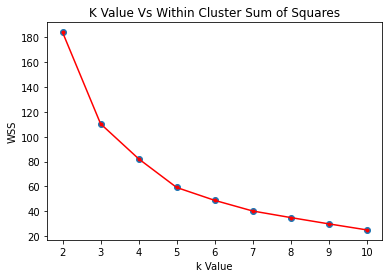

In [83]:
#Define a list of potential k values to test in the loop
k_list = [2,3,4,5,6,7,8,9,10]
#Initialize an empty list of WSS (Within CLuster Sum of Squares) values to be appended by the loop
WSS_list = []

#Build a loop to iterate over multiple values for k in K-Means
for k in k_list:
    
    # run k-means clustering
    kmeans = KMeans(n_clusters=k, random_state=0).fit(CGY_COMM_CLUSTER)
    #Append the WSS list
    WSS_list.append(kmeans.inertia_)
    
#Now generate a simple scatter plot for the purpose of visualizing the WSS values and applying the 'Elbow Method'
plt.scatter(k_list, WSS_list)
plt.plot(k_list, WSS_list, '.r-')
plt.title('K Value Vs Within Cluster Sum of Squares')
plt.xlabel('k Value')
plt.ylabel('WSS')

### Fit the K-Means Model for Our Ideal K Value and Acquire Cluster Labels and Assignments

In [84]:
#Set k equal to 8
k = 5

# run k-means clustering
kmeans = KMeans(n_clusters=k, random_state=0).fit(CGY_COMM_CLUSTER)

In [85]:
print(kmeans.labels_)
print(len(kmeans.labels_))

[0 0 0 3 3 2 4 2 0 3 3 3 3 3 0 3 0 4 3 4 4 0 3 3 3 1 4 4 3 3 1 1 2 2 3 3 3
 4 4 1 0 2 1 0 1 1 3 0 0 0 4 0 0 3 3 4 3 4 3 1 0 3 4 3 4 4 3 3 4 4 3 0 3 1
 0 1 3 3 0 0 3 1 4 3 3 3 4 0 3 1 4 3 0 0 4 3 0 3 3 4 4 3 4 0 3 0 4 0 4 3 0
 4 4 0 4 0 0 3 3 4 3 4 4 1 0 3 1 3 3 4 3 3 4 4 3 0 4 3 2 0]
140


### Visualize the Results

**The results of the K-Means clustering are denoted by color in the scatterplot below. Each point belongs to a specific community and their position in the plot corresponds to the intersection of their respective normalized median income and saturation values. 

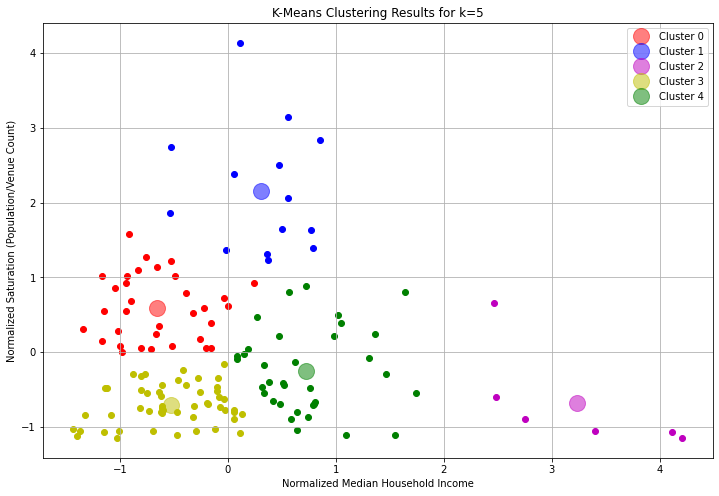

In [86]:
#Store our clustering results in a more intuitive variables
assignments = kmeans.labels_

#Create a figure object for plotting and establish it's size
plt.figure(figsize=(12,8))
#Obtain a list of each unique cluster label and establish a list of colors with both to be iterated over in a loop.
classes = np.unique(assignments)
colors= ['r','b','m','y', 'g'] 

#Build a loop to plot each cluster and respective centroids in a color unique to that cluster. 
for s,l in enumerate(classes):
    xs = CGY_COMM_CLUSTER.loc[:, 'Median Inc'] 
    ys = CGY_COMM_CLUSTER.loc[:, 'Saturation'] 
    plt.scatter(xs[assignments==s], ys[assignments==s], c = colors[s]) # color based on group
plt.plot(kmeans.cluster_centers_[0][0], kmeans.cluster_centers_[0][1], 'ro',markersize=16, alpha = 0.5, label= 'Cluster 0')
plt.plot(kmeans.cluster_centers_[1][0], kmeans.cluster_centers_[1][1], 'bo',markersize=16, alpha = 0.5, label= 'Cluster 1')
plt.plot(kmeans.cluster_centers_[2][0], kmeans.cluster_centers_[2][1], 'mo',markersize=16, alpha = 0.5, label= 'Cluster 2')
plt.plot(kmeans.cluster_centers_[3][0], kmeans.cluster_centers_[3][1], 'yo',markersize=16, alpha = 0.5, label= 'Cluster 3')
plt.plot(kmeans.cluster_centers_[4][0], kmeans.cluster_centers_[4][1], 'go',markersize=16, alpha = 0.5, label= 'Cluster 4')
plt.title('K-Means Clustering Results for k=5')
plt.xlabel('Normalized Median Household Income')
plt.ylabel('Normalized Saturation (Population/Venue Count)')
plt.legend()
plt.grid() 

### Perscribe Descriptive Titles to Each of the Possible Cluster Labels Based on the Plot Above

**Using the scatterplot above I prescribe descriptive titles to each of the clusters and their color code so that communitites can be easily identified on a map and their cluster characteristics easily understood.** 

- **Cluster 0 (Red): Low Income Moderate Saturation**. Perhaps the least attractive of the clusters as incomes are low and saturation is higher than all but cluster 4 (green).


- **Cluster 1 (Blue): Moderate Income High Saturation**. Highest saturation of all of the community clusters, but moderate income.


- **Cluster 2 (Purple/Magenta): High Income Low Saturation**. These communitites may be the communities our client wants to visit first. Their communities have fewer incumbent coffee shops and cafes, and the median household income is much higher than the rest.


- **Cluster 3 (Yellow): Low Income Low Saturation**. Similar in terms of income to cluster 3 (black), but perhaps higher potential due to lower saturation.


- **Cluster 4 (Green): Moderate Income Low Saturation**. Second highest potential community cluster based on the model and data.

### Now Construct a New Dataframe Incorporating Cluster Lables into Our Community Data

**First insert the cluster labels into the corresponding position in the cluster data subset (CGY_COMM_CLUSTER). Since index values were not reset when this set was derived it can then be merged with our original dataset easily.**

In [87]:
CGY_COMM_CLUSTER.insert(0, 'Cluster Labels', kmeans.labels_)
CGY_COMM_CLUSTER

,Cluster Labels,Median Inc,Saturation
0,0,-0.715152,0.046505
1,0,-0.949323,0.924074
2,0,-1.168466,0.146857
3,3,-0.614443,-0.745388
4,3,0.055289,-0.772285
...,...,...,...
146,0,-0.762499,1.270186
147,4,0.799373,-0.688727
148,3,-0.294158,-1.055758
150,2,2.470076,0.651690


**Now we can merge the above dataframe (CGY_COMM_CLUSTER) with our initial community profile subset (CGY_COMM_FULL) to get a new dataframe including cluster labels for each community**

In [88]:
print(CGY_COMM_FULL.shape)
print(CGY_COMM_CLUSTER.shape)

(153, 8)
(140, 3)


In [89]:
CGY_COMM_CLUSTERED = CGY_COMM_FULL.join(CGY_COMM_CLUSTER['Cluster Labels'], how = 'outer')
CGY_COMM_CLUSTERED.shape

(153, 9)

In [90]:
CGY_COMM_CLUSTERED

,Community,Sector,Class,Latitude,Longitude,Population,Median Inc,Venue Count,Cluster Labels
0,ABBEYDALE,NORTHEAST,Residential,51.058836,-113.929413,6150.0,81232.0,NaN,0.0
1,ACADIA,SOUTH,Residential,50.968655,-114.055587,10435.0,72552.0,NaN,0.0
2,ALBERT PARK/RADISSON HEIGHTS,EAST,Residential,51.044845,-113.990195,6640.0,64429.0,1.0,0.0
3,APPLEWOOD PARK,EAST,Residential,51.044658,-113.928931,6850.0,84965.0,3.0,3.0
4,ARBOUR LAKE,NORTHWEST,Residential,51.136786,-114.202355,10760.0,109790.0,5.0,3.0
...,...,...,...,...,...,...,...,...,...
148,WILLOW PARK,SOUTH,Residential,50.960293,-114.054645,5375.0,96837.0,7.0,3.0
149,WOLF WILLOW,SOUTH,Residential,50.871446,-114.001443,NaN,NaN,NaN,NaN
150,WOODBINE,SOUTH,Residential,50.942554,-114.128853,9105.0,199299.0,NaN,2.0
151,WOODLANDS,SOUTH,Residential,50.942435,-114.109359,6180.0,100352.0,1.0,0.0


### Map the Results

In [93]:
CLUSTER_MAP = folium.Map( location = [cgy_lat, cgy_long], zomm_start = 10)

for lat, lng, comm, clus in zip(CGY_COMM_CLUSTERED['Latitude'], CGY_COMM_CLUSTERED['Longitude'], 
                                          CGY_COMM_CLUSTERED['Community'], CGY_COMM_CLUSTERED['Cluster Labels']):
    
    if (clus == 0):
    
        label = '{}, Cluster{}: Low Income Moderate Saturation'.format(comm, clus)
        label = folium.Popup(label, parse_html=True)
        folium.CircleMarker(
            [lat, lng],
            radius=6,
            popup=label,
            color='red',
            fill=True,
            fill_color='#3186cc',
            fill_opacity=0.7,
            parse_html=False).add_to(CLUSTER_MAP)
        
    elif (clus == 1):
        
        label = '{}, Cluster{}: Moderate Income High Saturation'.format(comm, clus)
        label = folium.Popup(label, parse_html=True)
        folium.CircleMarker(
            [lat, lng],
            radius=6,
            popup=label,
            color='blue',
            fill=True,
            fill_color='#3186cc',
            fill_opacity=0.7,
            parse_html=False).add_to(CLUSTER_MAP)
    
    elif (clus == 2):
        
        label = '{}, Cluster{}: High Income Low Saturation'.format(comm, clus)
        label = folium.Popup(label, parse_html=True)
        folium.CircleMarker(
            [lat, lng],
            radius=6,
            popup=label,
            color='magenta',
            fill=True,
            fill_color='#3186cc',
            fill_opacity=0.7,
            parse_html=False).add_to(CLUSTER_MAP)
    
    elif (clus == 3):
        
        label = '{}, Cluster{}: Low Income Low Saturation'.format(comm, clus)
        label = folium.Popup(label, parse_html=True)
        folium.CircleMarker(
            [lat, lng],
            radius=6,
            popup=label,
            color='yellow',
            fill=True,
            fill_color='#3186cc',
            fill_opacity=0.7,
            parse_html=False).add_to(CLUSTER_MAP)
        
    elif (clus == 4):
        
        label = '{}, Cluster{}: Moderate Income Low Saturation'.format(comm, clus)
        label = folium.Popup(label, parse_html=True)
        folium.CircleMarker(
            [lat, lng],
            radius=6,
            popup=label,
            color='green',
            fill=True,
            fill_color='#3186cc',
            fill_opacity=0.7,
            parse_html=False).add_to(CLUSTER_MAP)
        
CLUSTER_MAP